In [1]:
import pandas as pd
from Bio import PDB
import os
os.chdir('..')
from functions.myfunctions import *
from functions.sequencefunctions import get_vregion_seq_with_gaps
import functions.distancefunctions as df
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
structures_dir = '../data/structures/stcrdab_all_structures/imgt/'
datalist = pd.read_csv('data/tcrdbset_unique_receptors.csv', index_col=0).drop_duplicates(subset = ['pdb'], keep='first')
datalist1 = pd.read_csv('data/tcrdb_export_cleaned.csv', index_col=0).drop_duplicates(subset = ['pdb'], keep='first')

In [3]:
datalist

,alpha_aa_imgt_shorter,beta_aa_imgt_shorter,pdb,Bchain,Achain,model,antigen_chain,antigen_type,antigen_name,antigen_het_name,...,affinity,affinity_method,affinity_temperature,affinity_pmid,engineered,alpha_aa_imgt,alpha_aa_imgt_withGaps,beta_aa_imgt,beta_aa_imgt_withGaps,epitope_aa
0,AKTTQPDSMESTEGETVHLPCSHATISGNEYIYWYRQVPLQGPEYV...,AVTQSPRNKVTVTGGNVTLSCRQTNSHNYMYWYRQDTGHGLRLIHY...,['6l9l'],['H'],['G'],[0],['F'],['peptide'],['ser-pro-ser-tyr-ala-tyr-his-gln-phe'],['NA'],...,['NA'],['NA'],['NA'],['NA'],[True],['AKTTQPDSMESTEGETVHLPCSHATISGNEYIYWYRQVPLQGPE...,['-AKTTQ-PDSMESTEGETVHLPCSHATISG-----NEYIYWYRQ...,['AVTQSPRNKVTVTGGNVTLSCRQTNSHNYMYWYRQDTGHGLRLI...,['--AVTQSPRNKVTVTGGNVTLSCRQTNSH-------NYMYWYRQ...,['SPSYAYHQF']
1,AKTTQPISMDSYEGQEVNITCNHNDIATSDYIMWYQQFPNQGPRFI...,DTAVSQTPKYLVRQTGKNESLKCEQNLGHNAMYWYKQDSKKLLKIM...,['7byd'],['J'],['I'],[0],['H'],['peptide'],['gly-gly-ala-ile'],['NA'],...,['NA'],['NA'],['NA'],['NA'],[True],['AKTTQPISMDSYEGQEVNITCNHNDIATSDYIMWYQQFPNQGPR...,['-AKTTQ-PISMDSYEGQEVNITCNHNDIAT-----SDYIMWYQQ...,['DTAVSQTPKYLVRQTGKNESLKCEQNLGHNAMYWYKQDSKKLLK...,['DTAVSQTPKYLVRQTGKNESLKCEQNLGH-------NAMYWYKQ...,['GGAI']
2,AKTTQPTSMDCAEGRAANLPCNHSTISGNEYVYWYRQIHSQGPQYI...,TGVSQNPRHKITKRGQNVTFRCDPISEHNRLYWYRQTLGQGPEFLT...,"['3dx9', '3dxa']","['D', 'E']","['C', 'D']","[0, 0]","['NA', 'C']","['NA', 'peptide']","['NA', 'ebv decapeptide epitope']","['NA', 'NA']",...,"['NA', 'NA']","['NA', 'NA']","['NA', 'NA']","['NA', 'NA']","[True, True]",['AKTTQPTSMDCAEGRAANLPCNHSTISGNEYVYWYRQIHSQGPQ...,['-AKTTQ-PTSMDCAEGRAANLPCNHSTISG-----NEYVYWYRQ...,['TGVSQNPRHKITKRGQNVTFRCDPISEHNRLYWYRQTLGQGPEF...,['-TGVSQNPRHKITKRGQNVTFRCDPISEH-------NRLYWYRQ...,"['NA', 'EENLLDFVRF']"
3,AQEVTQIPAALSVPEGENLVLNCSFTDSAIYNLQWFRQDPGKGLTS...,NAGVTQTPKFQVLKTGQSMTLQCSQDMNHEYMSWYRQDPGMGLRLI...,"['6zkw', '6zkx']","['E', 'E']","['D', 'D']","[0, 0]","['C', 'C']","['peptide', 'peptide']",['enoyl-[acyl-carrier-protein] reductase [nadh...,"['NA', 'NA']",...,"['NA', 'NA']","['NA', 'NA']","['NA', 'NA']","['NA', 'NA']","[True, True]",['AQEVTQIPAALSVPEGENLVLNCSFTDSAIYNLQWFRQDPGKGL...,['AQEVTQIPAALSVPEGENLVLNCSFTDSA------IYNLQWFRQ...,['NAGVTQTPKFQVLKTGQSMTLQCSQDMNHEYMSWYRQDPGMGLR...,['NAGVTQTPKFQVLKTGQSMTLQCSQDMNH-------EYMSWYRQ...,"['RLPAKAPLL', 'RLPAKAPLLGCG']"
4,AQEVTQIPAALSVPEGENLVLNCSFTDSAIYNLQWFRQDPGKGLTS...,AGVTQTPRYLIKTRGQQVTLSCSPISGHRSVSWYQQTPGQGLQFLF...,"['5brz', '5bs0']","['E', 'E']","['D', 'D']","[0, 0]","['C', 'C']","['peptide', 'peptide']","['glu-val-asp-pro-ile-gly-his-leu-tyr', 'titin']","['NA', 'NA']",...,"['NA', 'NA']","['NA', 'NA']","['NA', 'NA']","['NA', 'NA']","[True, True]",['AQEVTQIPAALSVPEGENLVLNCSFTDSAIYNLQWFRQDPGKGL...,['AQEVTQIPAALSVPEGENLVLNCSFTDSA------IYNLQWFRQ...,['AGVTQTPRYLIKTRGQQVTLSCSPISGHRSVSWYQQTPGQGLQF...,['-AGVTQTPRYLIKTRGQQVTLSCSPISGH-------RSVSWYQQ...,"['EVDPIGHLY', 'ESDPIVAQY']"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209,SQQGEEDPQALSIQEGENATMNCSYKTSINNLQWYRQNSGRGLVHL...,NAGVTQTPKFRVLKTGQSMTLLCAQDMNHEYMYWYRQDPGMGLRLI...,['7t2b'],['E'],['D'],[0],['C'],['peptide'],['pneumolysin-derived peptide'],['NA'],...,['NA'],['NA'],['NA'],['NA'],[True],['SQQGEEDPQALSIQEGENATMNCSYKTSINNLQWYRQNSGRGLV...,['SQQGEEDPQALSIQEGENATMNCSYKTSI-------NNLQWYRQ...,['NAGVTQTPKFRVLKTGQSMTLLCAQDMNHEYMYWYRQDPGMGLR...,['NAGVTQTPKFRVLKTGQSMTLLCAQDMNH-------EYMYWYRQ...,['GATGLAWEWWRTVYE']
210,SQQGEEDPQALSIQEGENATMNCSYKTSINNLQWYRQNSGRGLVHL...,GAVVSQHPSWVISKSGTSVKIECRSLDFQATTMFWYRQFPKQSLML...,['1ymm'],['E'],['D'],[0],['C'],['peptide'],['mbp peptide'],['NA'],...,['NA'],['NA'],['NA'],['NA'],[True],['SQQGEEDPQALSIQEGENATMNCSYKTSINNLQWYRQNSGRGLV...,['SQQGEEDPQALSIQEGENATMNCSYKTSI-------NNLQWYRQ...,['GAVVSQHPSWVISKSGTSVKIECRSLDFQATTMFWYRQFPKQSL...,['GAVVSQHPSWVISKSGTSVKIECRSLDFQ------ATTMFWYRQ...,['ENPVVHFFKNIVTP']
211,SVTQPDARVTVSEGASLQLRCKYSYSATPYLFWYVQYPRQGPQLLL...,AAVTQSPRNKVAVTGEKVTLSCNQTNNHNNMYWYRQDTGHELRLIY...,['3e3q'],['a'],['Z'],[0],['b'],['peptide'],['unknown'],['NA'],...,['NA'],['NA'],['NA'],['NA'],[True],['SVT

In [4]:
from Levenshtein import distance as lev

datalist['alpha_aa_imgt_shorter_withgaps'] = [get_vregion_seq_with_gaps(x) for x in datalist['alpha_aa_imgt_shorter']]
datalist['beta_aa_imgt_shorter_withgaps'] = [get_vregion_seq_with_gaps(x) for x in datalist['beta_aa_imgt_shorter']]
print(max(len(x) for x in datalist['alpha_aa_imgt_shorter_withgaps']), min(len(x) for x in datalist['alpha_aa_imgt_shorter_withgaps']))
print(max(len(x) for x in datalist['beta_aa_imgt_shorter_withgaps']), min(len(x) for x in datalist['beta_aa_imgt_shorter_withgaps']))

131 127
132 126


['6l9l'] ['6l9l']
--AVTQSPRNKVTVTGGNVTLSCRQTNSH-------NYMYWYRQDTGHGLRLIHYSYG----AGNLQIGDVP-DGYKATRT-TQEDFFLLLELASPSQTSLYFCASSDG--------DYEQYFGPGTRLTVL
--AVTQSPRNKVTVTGGNVTLSCRQTNSH-------NYMYWYRQDTGHGLRLIHYSYG----AGNLQIGDVP-DGYKATRT-TQEDFFLLLELASPSQTSLYFCASSDG--------DYEQYFGPGTRLTVL
['6l9l'] ['7byd']
--AVTQSPRNKVTVTGGNVTLSCRQTNSH-------NYMYWYRQDTGHGLRLIHYSYG----AGNLQIGDVP-DGYKATRT-TQEDFFLLLELASPSQTSLYFCASSDG--------DYEQYFGPGTRLTVL
DTAVSQTPKYLVRQTGKNESLKCEQNLGH-------NAMYWYKQDSKKLLKIMFIYNN----KEPILNETVP-YRFSPKSP-DKAHLNLHIKSLELGDSAVYFCASSQDL---GAGEVYEQYFGPGTRLTVI
['6l9l'] ['3dx9', '3dxa']
--AVTQSPRNKVTVTGGNVTLSCRQTNSH-------NYMYWYRQDTGHGLRLIHYSYG----AGNLQIGDVP-DGYKATRT-TQEDFFLLLELASPSQTSLYFCASSDG--------DYEQYFGPGTRLTVL
-TGVSQNPRHKITKRGQNVTFRCDPISEH-------NRLYWYRQTLGQGPEFLTYFQN----EAQLEKSRLLSDRFSAERP-KGSFSTLEIQRTEQGDSAMYLCASRYRD-----DSYNEQFFGPGTRLTVL
['6l9l'] ['6zkw', '6zkx']
--AVTQSPRNKVTVTGGNVTLSCRQTNSH-------NYMYWYRQDTGHGLRLIHYSYG----AGNLQIGDVP-DGYKATRT-TQEDFFLLLELASPSQTSLYFCASSDG-----

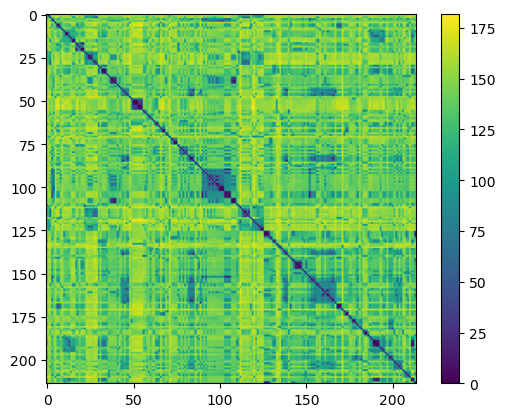

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5, 0.5, 1.0, 1.0, 0.5, 0.5, 0.3333333333333333, 1.0, 1.0, 0.3333333333333333, 0.3333333333333333, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 1.0, 1.0, 0.25, 1.0, 1.0, 1.0, 1.0, 0.3333333333333333, 1.0, 1.0, 1.0, 1.0, 1.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.5, 0.3333333333333333, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5, 0.5, 1.0, 1.0, 1.0, 0.5, 1.0, 0.5, 1.0, 0.5, 0.5, 0.3333333333333333, 1.0, 1.0, 1.0, 0.5, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5, 1.0, 0.5, 1.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.25, 0.3333333333333333, 0.5, 0.3333333333333333, 0.25, 0.25, 0.25, 1.0, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,

In [5]:

alpha_dists = np.empty(shape = (datalist.shape[0], datalist.shape[0]))
beta_dists = np.empty(shape = (datalist.shape[0], datalist.shape[0]))

max_len_a = max(len(x) for x in datalist['alpha_aa_imgt_shorter_withgaps'])
max_len_b = max(len(x) for x in datalist['beta_aa_imgt_shorter_withgaps'])

for i in range(datalist.shape[0]):
    for j in range(datalist.shape[0]):
        pdbx = datalist.iloc[i]['pdb']
        pdby = datalist.iloc[j]['pdb']
        xa = datalist.iloc[i]['alpha_aa_imgt_shorter_withgaps']
        ya = datalist.iloc[j]['alpha_aa_imgt_shorter_withgaps']
        if pdbx == '[\'7jwj\']':
            xa = ''.join(list(xa)[1:])
        if pdby == '[\'7jwj\']':
            ya = ''.join(list(ya)[1:])
        if pdbx != '[\'3vxt\', \'3vxu\', \'3w0w\']':
            assert xa[103] == 'C'
        else:
            assert xa[103] == 'W'
        if pdby != '[\'3vxt\', \'3vxu\', \'3w0w\']':
            assert ya[103] == 'C'
        else:
            assert ya[103] == 'W'
        
        if len(xa) < max_len_a:
            xa = list(xa)
            xa = ''.join(xa[:110] + ['-']*(max_len_a-len(xa)) + xa[110:])
        if len(ya) < max_len_a:
            ya = list(ya)
            ya = ''.join(ya[:110] + ['-']*(max_len_a-len(ya)) + ya[110:])

        if pdbx != '[\'3vxt\', \'3vxu\', \'3w0w\']':
            assert xa[103] == 'C'
        else:
            assert xa[103] == 'W'
        if pdby != '[\'3vxt\', \'3vxu\', \'3w0w\']':
            assert ya[103] == 'C'
        else:
            assert ya[103] == 'W'
        
        assert len(xa) == len(ya)
        
        xb = datalist.iloc[i]['beta_aa_imgt_shorter_withgaps']
        yb = datalist.iloc[j]['beta_aa_imgt_shorter_withgaps']

        assert xb[103] == 'C'
        assert yb[103] == 'C'

        if len(xb) < max_len_b:
            xb = list(xb)
            xb = ''.join(xb[:110] + ['-']*(max_len_b-len(xb)) + xb[110:])
        if len(yb) < max_len_b:
            yb = list(yb)
            yb = ''.join(yb[:110] + ['-']*(max_len_b-len(yb)) + yb[110:])
        assert xb[103] == 'C'
        assert yb[103] == 'C'
        print(pdbx, pdby)
        print(xb)
        print(yb)
        assert len(xb) == len(yb)

        alpha_dists[i,j] = lev(xa, ya)
        beta_dists[i,j] = lev(xb,yb)

print(alpha_dists)
print(beta_dists)

ab_dists = alpha_dists + beta_dists
plt.imshow(ab_dists)
plt.colorbar()
plt.show()

weigth_vector = [1/np.sum(ab_dists[i] < 11) for i in range(ab_dists.shape[0])]
print(weigth_vector)
print(sum(weigth_vector))

In [6]:
p = PDB.PDBParser()

distances = {}

for pdb in list(datalist.pdb):
    for ppdb in pdb.split(','):
        ppdb = ppdb.strip('[]\' ')
        s = ppdb + '.pdb'
        print(ppdb)

        struc = p.get_structure(ppdb, structures_dir + s)
        achain = list(datalist1.loc[datalist1.pdb == ppdb]['Achain'])[0]
        bchain = list(datalist1.loc[datalist1.pdb == ppdb]['Bchain'])[0]

        d = df.CA_pairwise_distances(struc[0][achain],struc[0][bchain])
        distances[ppdb] = d

6l9l
7byd
3dx9
3dxa
6zkw
6zkx
5brz
5bs0
4wnq
7ow5
7ow6
7pb2
7t2d
6rpa
6vm7
6vm8
6fra
6eh6
6eh7
6fr9
6frb
6frc
6fum
6fun
6fuo
6fup
6fuq
6fur
3tfk
3tjh
3tpu
4ms8
4mvb
4mxq
4n0c
4n5e
3vxm
8gvb
8gvg
8gvi
5yxu
6vrn
6p64
6uk2
6uk4
5yxn
5jzi
7n5c
5d2n
4gg6
4gg8
4z7u
4z7v
7dzm
7dzn
5wjo
6rsy
3rgv
1nfd
2pxy
2z31
2z35
5d7k
4mji
5ks9
5ksb
4prh
4pri
5ksa
2ypl
4jry
3utp
3uts
3utt
5c07
5c08
5c09
5c0a
5c0b
5c0c
5hyj
3qdg
3qdj
3qeu
6am5
6amu
3hg1
4qok
6eqa
7q99
7q9a
4zdh
6uz1
3o4l
7jwj
4p2o
3qib
3qjf
4p2q
4p2r
3qjh
3qiu
3qiw
4qrp
1zgl
7nme
7nmf
7nmg
6ovo
5tez
7z50
6r2l
3mbe
6mra
6cuh
4dzb
4g8e
4g8f
5w1v
5w1w
5e6i
7sg1
6vmx
5d2l
6cqn
6cph
6cql
6cqq
6cqr
5jhd
2ial
2iam
2ian
4e41
4e42
5men
4udt
4mnq
5nmd
5nme
5nmf
5nmg
1ao7
1qrn
1qse
1qsf
2gj6
3h9s
3pwp
3qfj
3qh3
7amp
7amq
7amr
7ams
4ftv
4grm
4l3e
6d78
3ffc
4g8g
4g9f
6tro
4jfd
4jff
6tmo
2f53
4ww1
7r7z
7r80
6px6
7n2n
7n2o
5eu6
8cx4
3vxq
3vxr
3vxs
7n2s
7n2p
7n2q
7n2r
6fr3
6fr4
6eh5
6fr5
6eh4
2pye
2pyf
2p5e
2f54
2p5w
3mv9
3mv8
3mv7
4prp
2q86
3pqy
7n5p
4ozi


In [7]:
def sort_distance_df(d2):
    res_numbers = list(range(1, 85)) + ['84A'] + list(range(85, 112)) + ['111A', '111B',
                    '111C', '111D', '111E', '111F', '112E', '112F', '112D', '112C', '112B', '112A', '112'] + list(range(113, 400))
    res_numbers_v = list(range(1, 85)) + ['84A'] + list(range(85, 112)) + ['111A', '111B',
                        '111C', '111D', '111E', '111F', '112E', '112F', '112D', '112C', '112B', '112A', '112'] + list(range(113, 131))
    rule = {
     str(x):i for i, x in enumerate(res_numbers)
    }

    d2['C'] = [rule[x] for x in d2.index.values]
    d2 = d2.sort_values(by=['C']).drop(['C'], axis = 1)

    d3 = d2.T
    d3['C'] = [rule[x] for x in d3.index.values]
    d3 = d3.sort_values(by=['C']).drop(['C'], axis = 1)
    d4 = d3.T
    d4_vreg = d4.loc[d4.index.isin([str(x) for x in res_numbers_v])]
    d4_vreg = d4_vreg.T.loc[d4_vreg.columns.isin([str(x) for x in res_numbers_v])].T
    return(d4_vreg)


In [8]:
def plot_heatmap(mydf, save='no', myoutput=None, cmap = 'rocket', vmin=3, vmax=20, clabel = r'C$\alpha$-C$\alpha$ distance ($\AA$)'):
     c = (save.lower() == 'no') or (save.lower() == 'yes')
     # print(c)
     assert c, 'ERROR: save must be one of yes or no'

     fig, ax = plt.subplots(figsize=(13,16))
     myax = sns.heatmap(mydf, vmax = vmax, vmin = vmin, cmap=cmap, 
                        cbar_kws = {'orientation':'horizontal', 'pad':0.1, 'fraction':0.1})
     cbar = myax.collections[0].colorbar
     cbar.ax.tick_params(labelsize=18)
     cbar.set_label(clabel, fontsize= 24)

     y1_1 = list(mydf.index.values).index("26") + 0.5
     y1_2 = list(mydf.index.values).index("39")+ 0.5
     x1_1 = list(mydf.columns.values).index("26") + 0.5
     x1_2 = list(mydf.columns.values).index("39") + 0.5

     y2_1 = list(mydf.index).index("55") + 0.5
     y2_2 = list(mydf.index).index("66") + 0.5
     x2_1 = list(mydf.columns).index("55") + 0.5
     x2_2 = list(mydf.columns).index("66") + 0.5

     y3_1 = list(mydf.index).index("104") + 0.5
     y3_2 = list(mydf.index).index("118") + 0.5
     x3_1 = list(mydf.columns).index("104") + 0.5
     x3_2 = list(mydf.columns).index("118") + 0.5

     ymax =  len(mydf.index)
     xmax =  len(mydf.columns)
     print(ymax)
     ax.vlines(x1_1, ymin=0, ymax =ymax, lw=3, color='cyan')
     ax.vlines(x1_2, ymin=0, ymax =ymax, lw=3, color='cyan')
     ax.vlines(x2_1, ymin=0, ymax =ymax, lw=3, color='teal')
     ax.vlines(x2_2, ymin=0, ymax =ymax, lw=3, color='teal')
     ax.vlines(x3_1, ymin=0, ymax =ymax, lw=3, color='mediumpurple')
     ax.vlines(x3_2, ymin=0, ymax =ymax, lw=3, color='mediumpurple')

     ax.hlines(y1_1, xmin=0, xmax =xmax, lw=3, color='cyan')
     ax.hlines(y1_2, xmin=0, xmax =xmax, lw=3, color='cyan')
     ax.hlines(y2_1, xmin=0, xmax =xmax, lw=3, color='teal')
     ax.hlines(y2_2, xmin=0, xmax =xmax, lw=3, color='teal')
     ax.hlines(y3_1, xmin=0, xmax =xmax, lw=3, color='mediumpurple')
     ax.hlines(y3_2, xmin=0, xmax =xmax, lw=3, color='mediumpurple')
     # ax.set_aspect('equal')

     plt.yticks(fontsize=14)
     plt.xticks(rotation=90, fontsize=14)

     plt.text(x = (x1_1 + x1_2)/2, y = -2, s = r'CDR1$\beta$', fontsize = 30, 
               horizontalalignment = 'center', verticalalignment = 'bottom',
               color = 'cyan', weight = 'bold')
     plt.text(x = (x2_1 + x2_2)/2, y = -2, s = r'CDR2$\beta$', fontsize = 30, 
               horizontalalignment = 'center', verticalalignment = 'bottom',
               color = 'teal',weight = 'bold')
     plt.text(x = (x3_1 + x3_2)/2, y = -2, s = r'CDR3$\beta$', fontsize = 30, 
               horizontalalignment = 'center', verticalalignment = 'bottom',
               color='mediumpurple',weight = 'bold')
     plt.text(y = (y1_1 + y1_2)/2, x=4, s = r'CDR1$\alpha$', fontsize = 30, 
               verticalalignment = 'center', 
               color = 'cyan', weight = 'bold')
     plt.text(y = (y2_1 + y2_2)/2, x=4, s = r'CDR2$\alpha$', fontsize = 30, 
               verticalalignment = 'center',  
               color = 'teal', weight = 'bold')
     plt.text(y = (y3_1 + y3_2)/2, x=4, s = r'CDR3$\alpha$', fontsize = 30, 
               verticalalignment = 'center', 
               color = 'mediumpurple', weight = 'bold')

     plt.ylabel(r'TCR$\alpha$', fontdict={'size':30})
     plt.xlabel(r'TCR$\beta$', fontdict={'size':30})
     # plt.tight_layout()

     if save == 'yes':
          assert myoutput, 'ERROR: please assign output folder and name'
          plt.savefig(myoutput, format = 'png', bbox_inches='tight')
     plt.show()

In [9]:
f1 = 'figures/'

In [10]:
mydict = {('a0','b0'):1, ('a1','b1'):1, ('a0','b2'):1}
print(pd.Series(mydict))
print(pd.Series(mydict).unstack())

a0  b0    1
a1  b1    1
a0  b2    1
dtype: int64
     b0   b1   b2
a0  1.0  NaN  1.0
a1  NaN  1.0  NaN


112


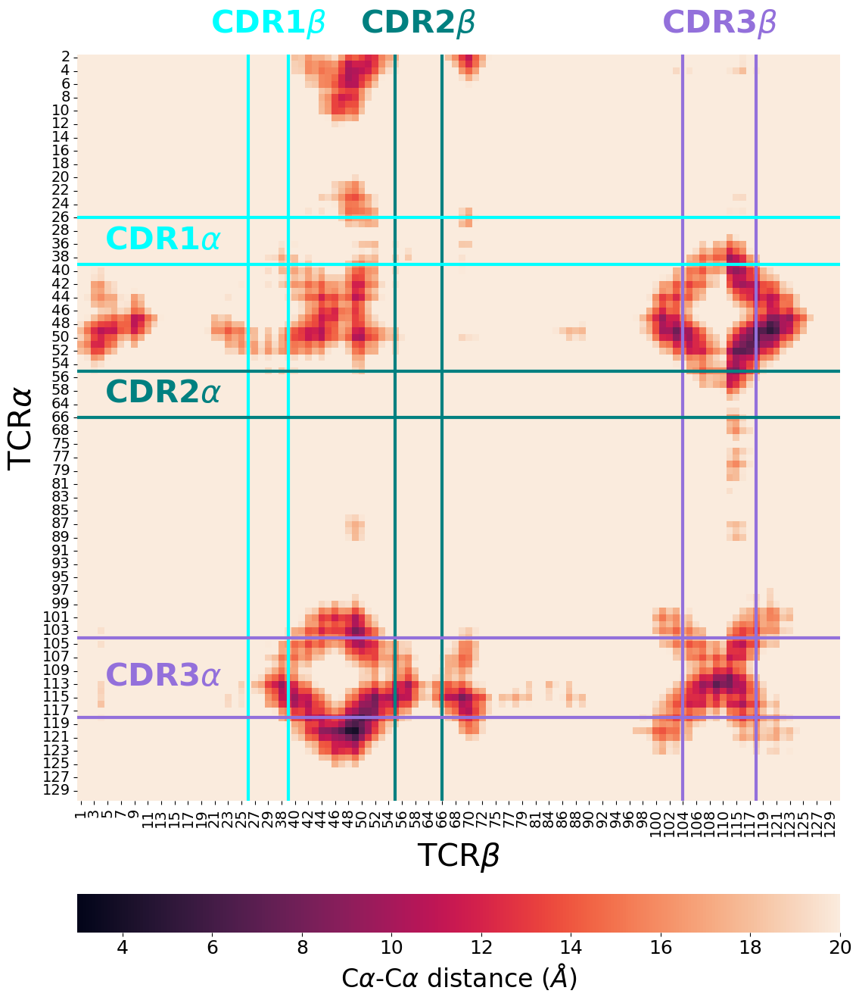

112


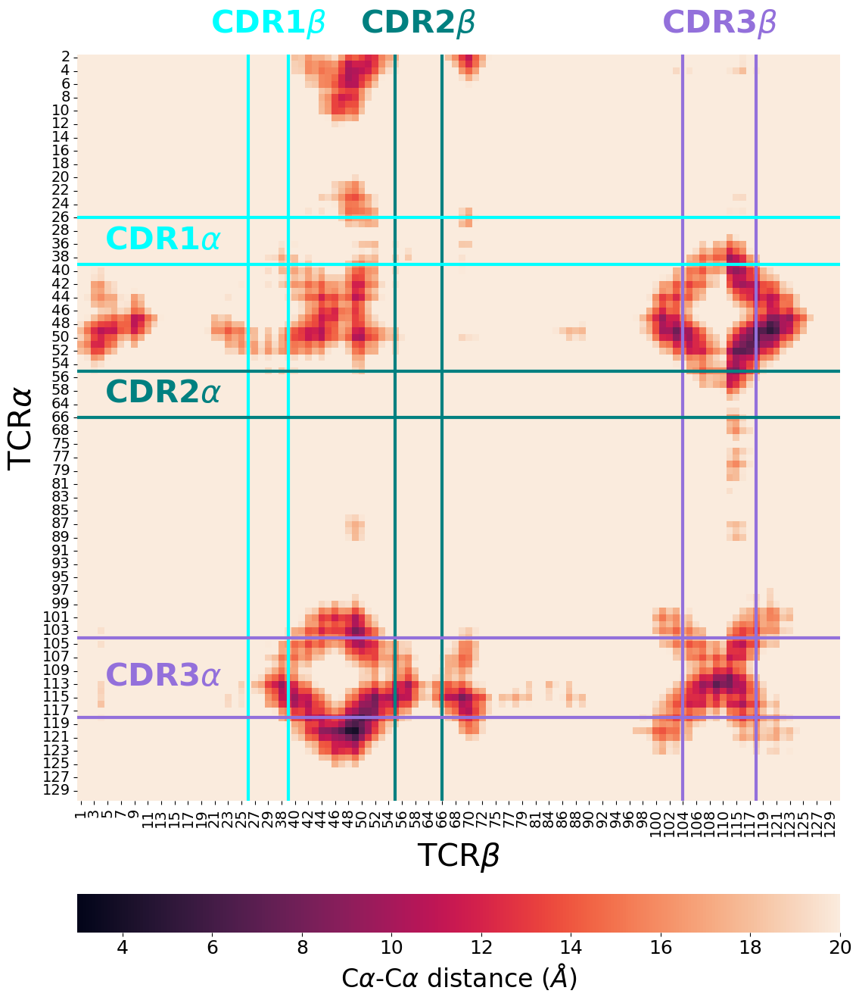

In [11]:
distance_df = pd.Series(distances['3qh3']).unstack()
distance_df = sort_distance_df(distance_df)
plot_heatmap(distance_df,
             save='yes', myoutput= f1 + '3qh3_interchain.png')

110


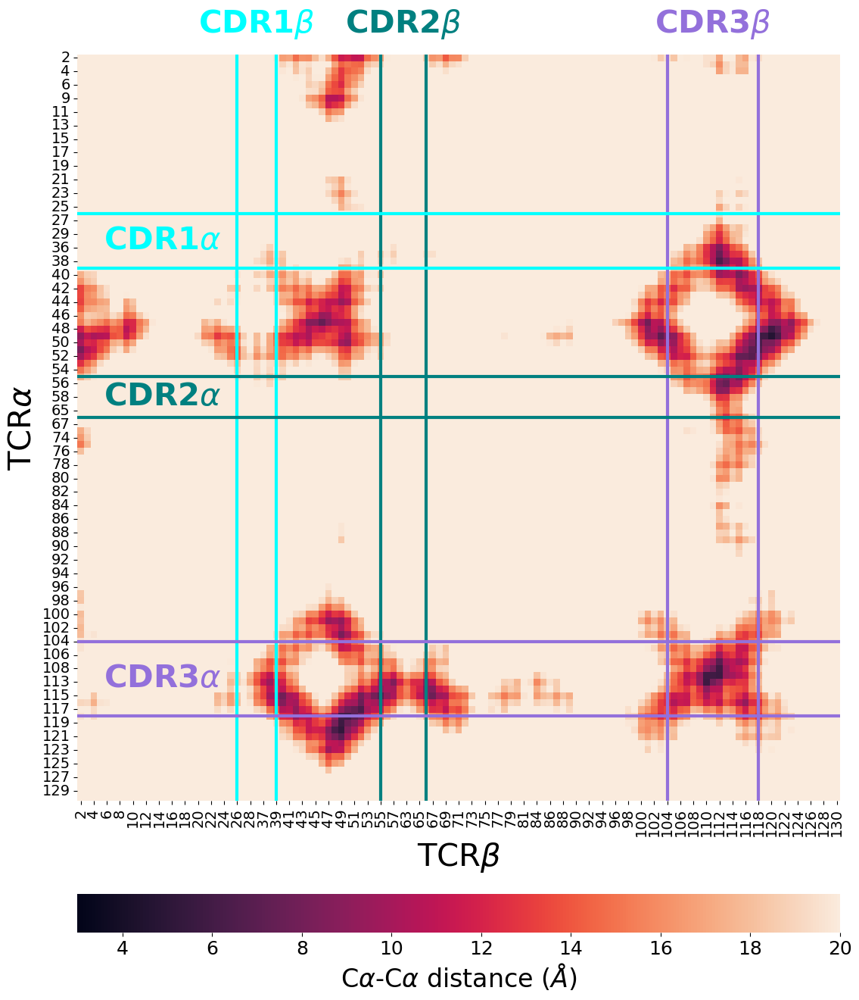

110


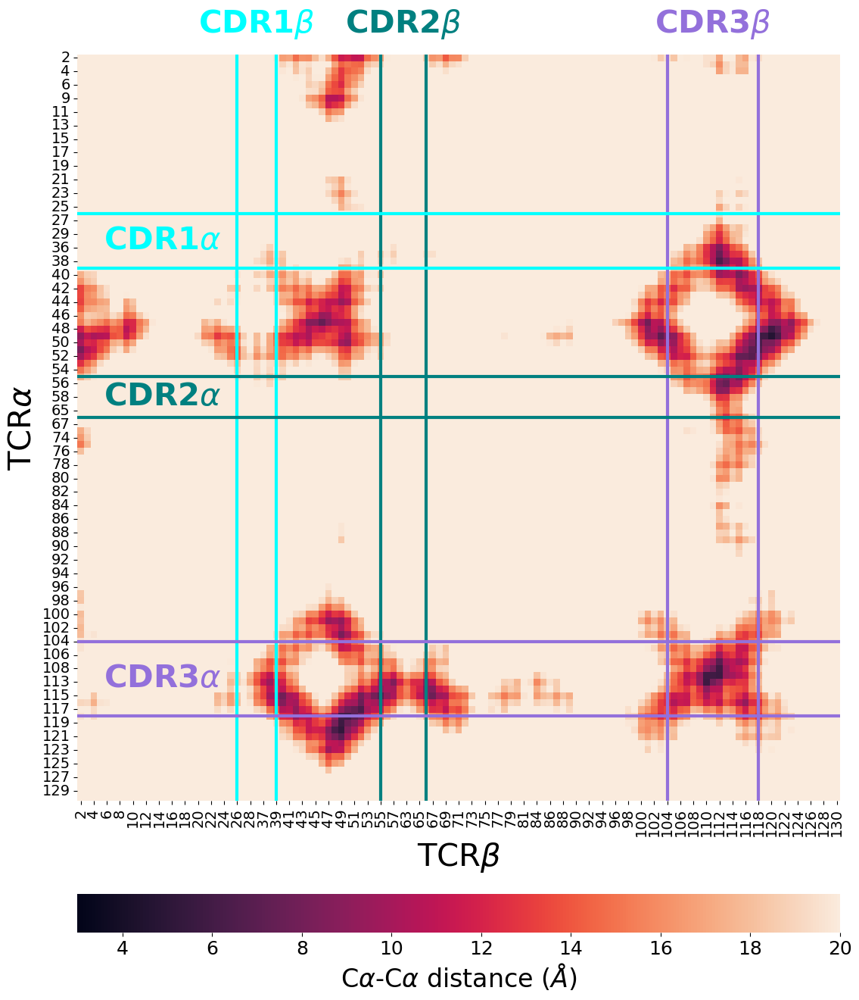

In [12]:
distance_df = pd.Series(distances['3dx9']).unstack()
distance_df = sort_distance_df(distance_df)
plot_heatmap(distance_df,
             save='yes', myoutput= f1 + '3dx9_interchain.png')

112


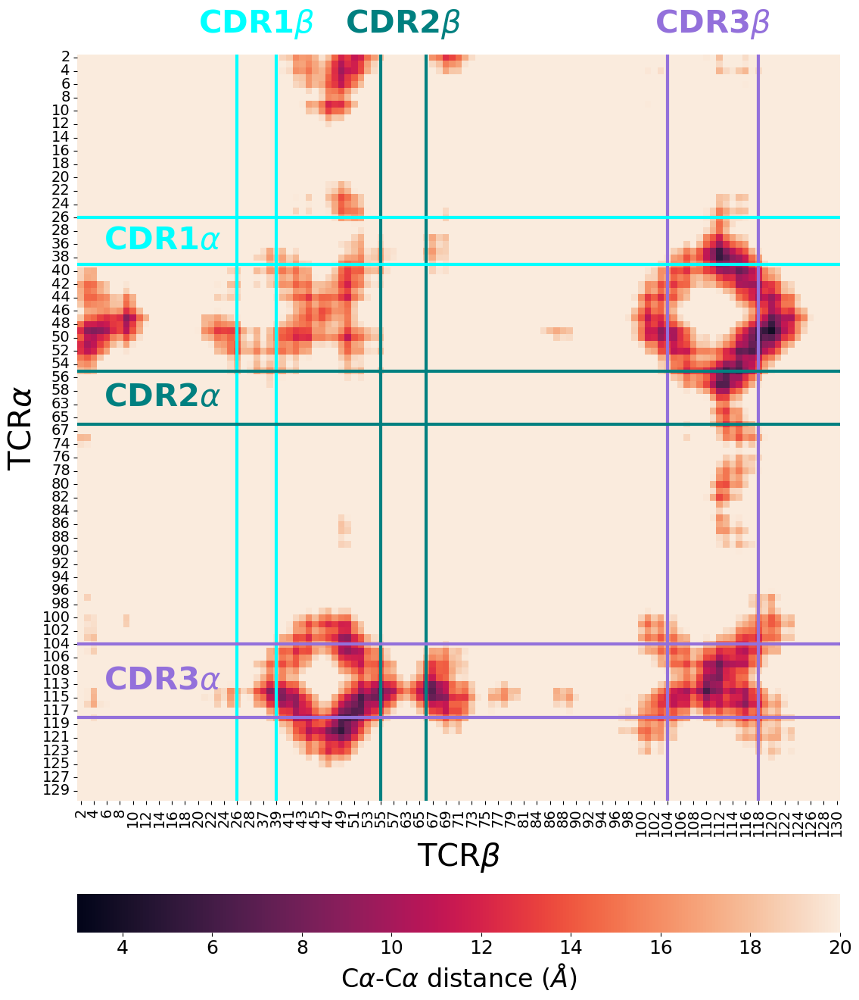

112


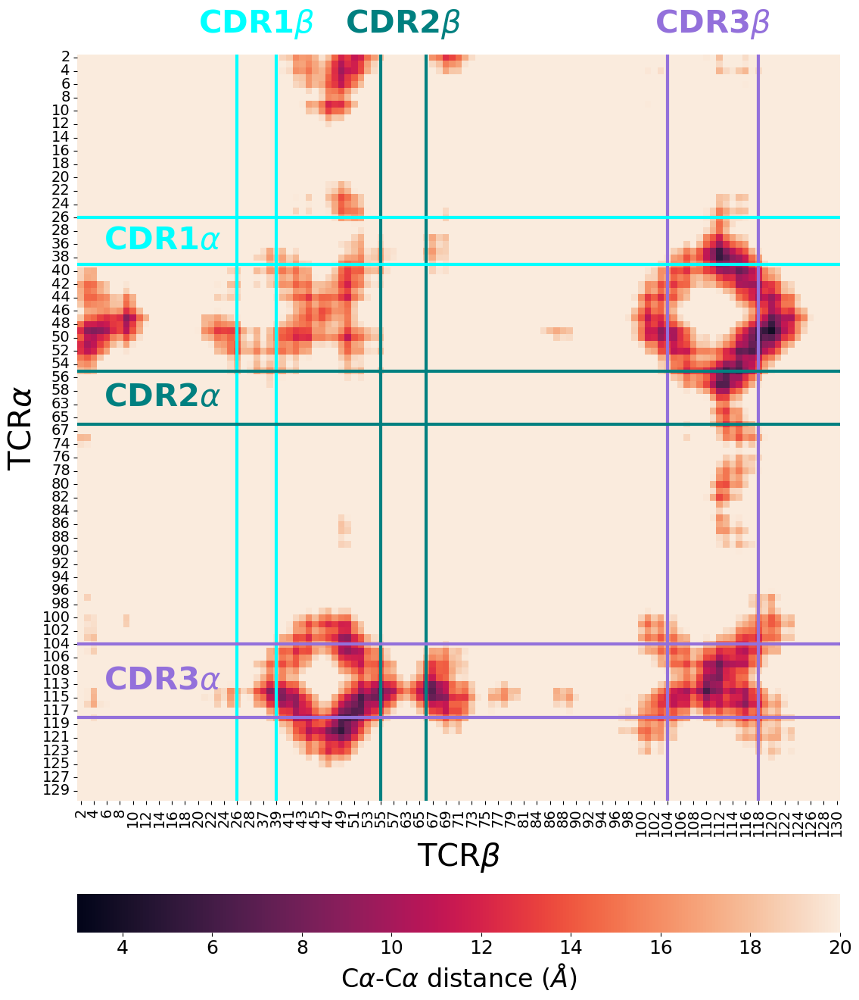

In [13]:
distance_df = pd.Series(distances['6cph']).unstack()
distance_df = sort_distance_df(distance_df)
plot_heatmap(distance_df,
             save='yes', myoutput= f1 + '6cph_interchain.png')

110


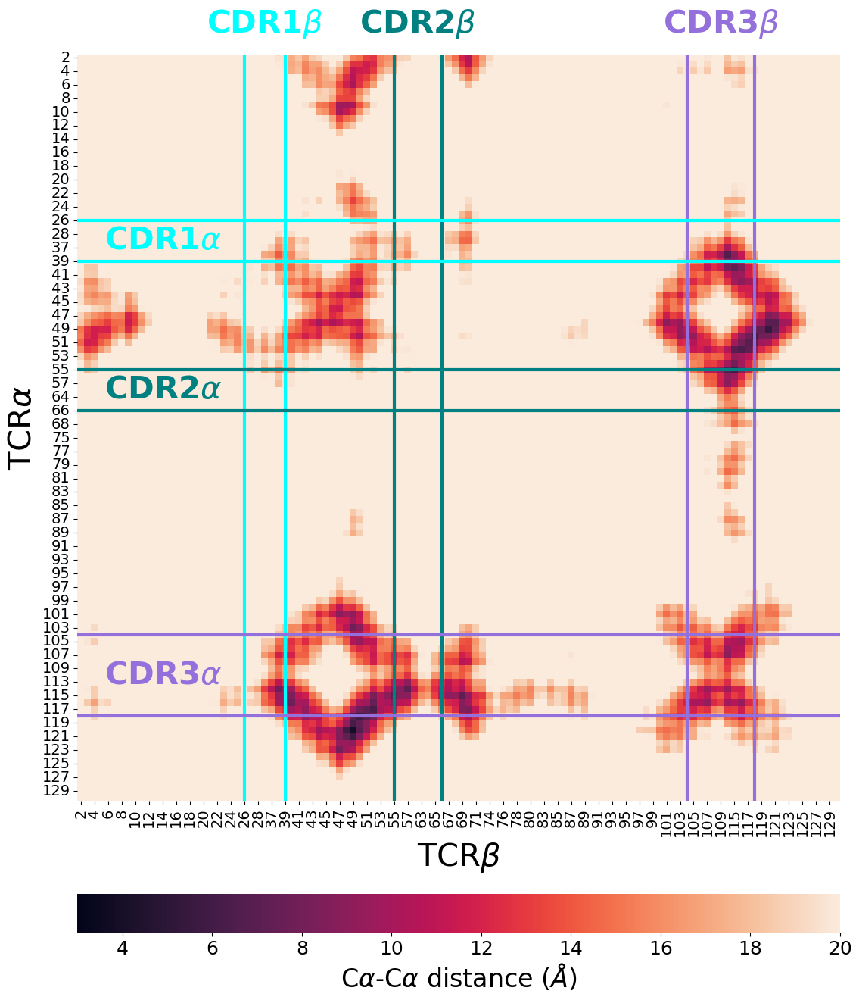

110


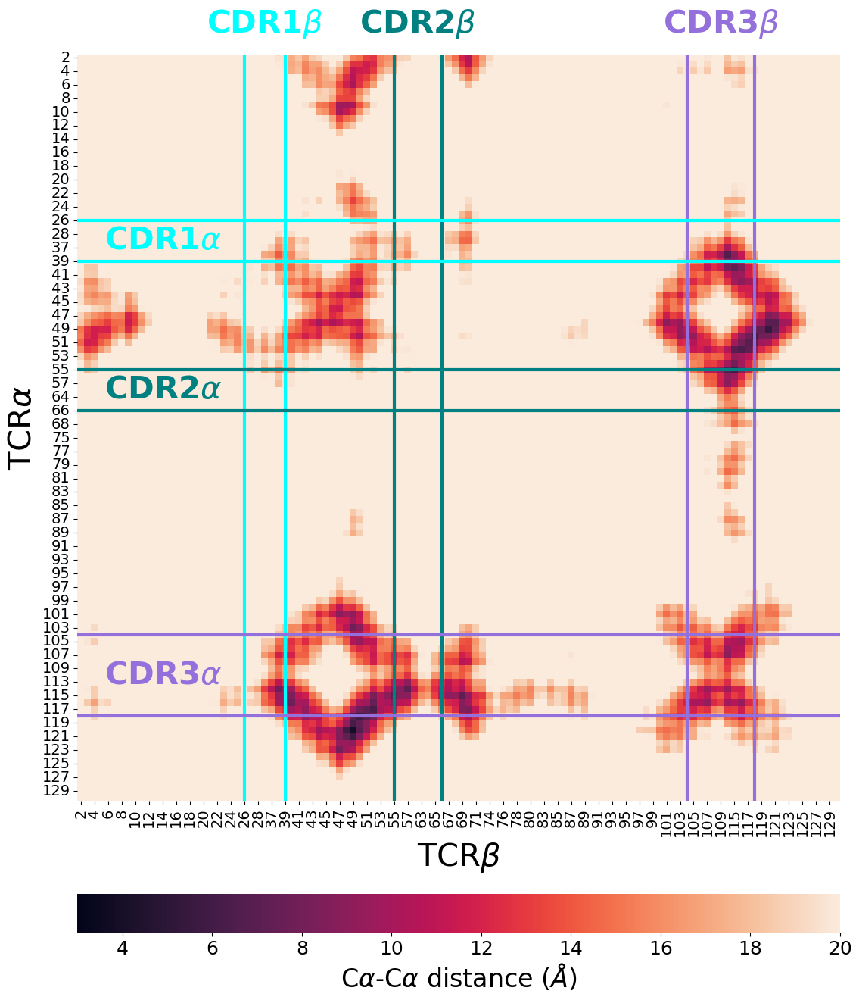

In [14]:
distance_df = pd.Series(distances['2ial']).unstack()
distance_df = sort_distance_df(distance_df)
plot_heatmap(distance_df,
             save='yes', myoutput= f1 + '2ial_interchain.png')

In [15]:
non_redudant_pdbs = [x[0].strip('[] \'') for x in datalist['pdb'].str.split(',')]
print(non_redudant_pdbs)
print(len(non_redudant_pdbs))

['6l9l', '7byd', '3dx9', '6zkw', '5brz', '4wnq', '7ow5', '7pb2', '7t2d', '6rpa', '6vm7', '6fra', '6eh6', '3tfk', '3vxm', '8gvb', '8gvi', '5yxu', '6vrn', '6p64', '5yxn', '5jzi', '7n5c', '5d2n', '4gg6', '4z7u', '4z7v', '7dzm', '5wjo', '6rsy', '3rgv', '1nfd', '2pxy', '2z31', '2z35', '5d7k', '4mji', '5ks9', '5ksb', '4prh', '5ksa', '2ypl', '4jry', '3utp', '3qdg', '3hg1', '4zdh', '6uz1', '3o4l', '7jwj', '4p2o', '3qib', '3qjf', '4p2q', '3qjh', '3qiu', '4qrp', '1zgl', '7nme', '6ovo', '5tez', '7z50', '6r2l', '3mbe', '6mra', '6cuh', '4dzb', '4g8e', '4g8f', '5w1v', '5e6i', '7sg1', '6vmx', '5d2l', '6cqn', '6cph', '5jhd', '2ial', '4e41', '5men', '4udt', '4mnq', '5nmd', '1ao7', '4ftv', '4l3e', '3ffc', '4g8g', '6tro', '4jfd', '2f53', '4ww1', '7r7z', '6px6', '7n2n', '5eu6', '8cx4', '3vxq', '7n2s', '7n2p', '6fr3', '6eh5', '6eh4', '2pye', '2p5e', '2f54', '2p5w', '3mv9', '3mv8', '3mv7', '2q86', '3pqy', '4ozi', '1kgc', '4ozf', '4ozg', '2esv', '4ozh', '6bj2', '7rk7', '7t2c', '6at6', '7rrg', '6avg', '6ulr',

In [16]:
reduced_dist = {k:distances[k] for k in non_redudant_pdbs}

In [17]:
distance_df = pd.DataFrame.from_dict(reduced_dist)
print(distance_df)
distance_df.reset_index(names=['alpha', 'beta']).T.to_csv('data/output/interchain_dist_uniqueTCRs.csv.gz')

            6l9l       7byd       3dx9       6zkw       5brz       4wnq  \
2   3  29.037203  28.165857  26.653299  28.087408  28.912373  27.910433   
    4  27.302378  26.599739  25.113909  26.397888  26.849209  26.074440   
    5  29.834845  29.294081  26.911928  28.744417  29.134956  28.158262   
    6  29.678223  29.050684  26.551956  28.018221  28.838305  27.244930   
    7  32.553593  31.915314  29.322433  30.761913  31.539507  29.956411   
...          ...        ...        ...        ...        ...        ...   
267 2        NaN        NaN        NaN        NaN        NaN        NaN   
268 1        NaN        NaN        NaN        NaN        NaN        NaN   
    2        NaN        NaN        NaN        NaN        NaN        NaN   
269 1        NaN        NaN        NaN        NaN        NaN        NaN   
    2        NaN        NaN        NaN        NaN        NaN        NaN   

            7ow5       7pb2       7t2d       6rpa  ...  7pbe       3sjv  7rm4  \
2   3  28.117191  

In [18]:
# remove rows for which I have less than 75% of values
min_count = distance_df.shape[1]*0.75
d0 = distance_df.dropna(axis = 0, thresh = min_count)

In [19]:
# take the avg of each value
avg_ = d0.mean(axis = 1)
# now make the average a matrix itself
d1 = avg_.unstack()

# also calculate number of structures that make contact
count = d0[d0 <= 10].T.count().unstack()

110


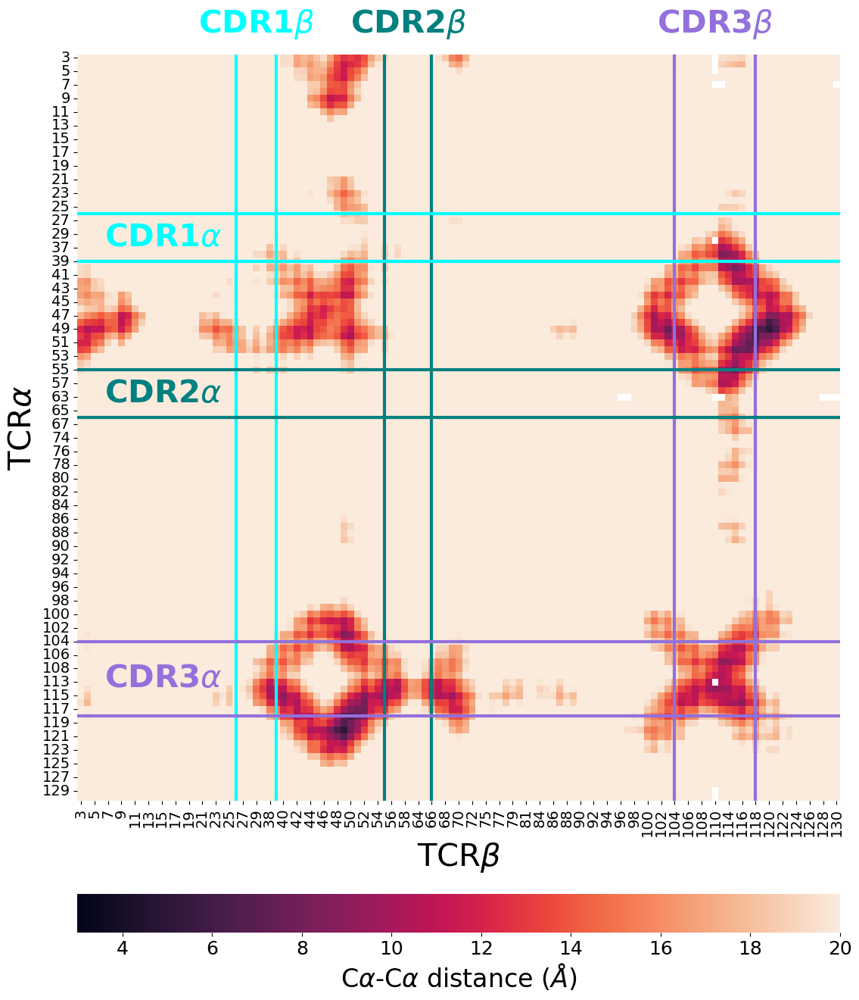

110


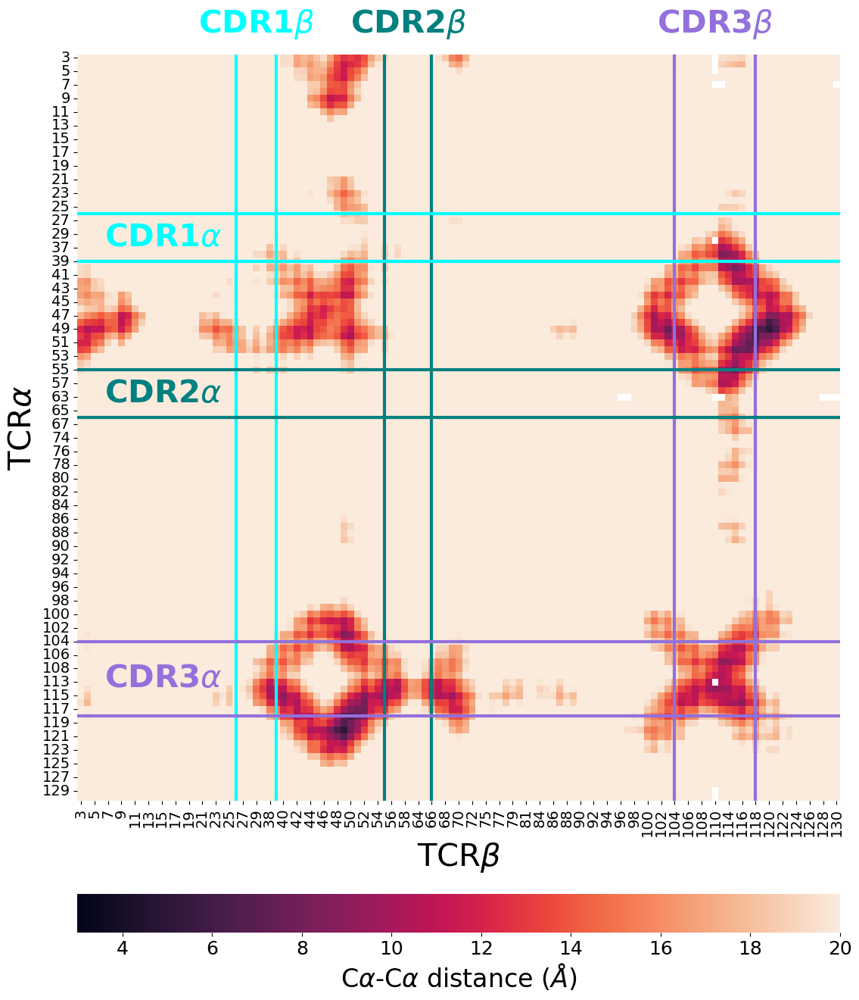

In [20]:
plot_heatmap(sort_distance_df(d1),
             save='yes', myoutput= f1 + 'avg_interchain.png')

110


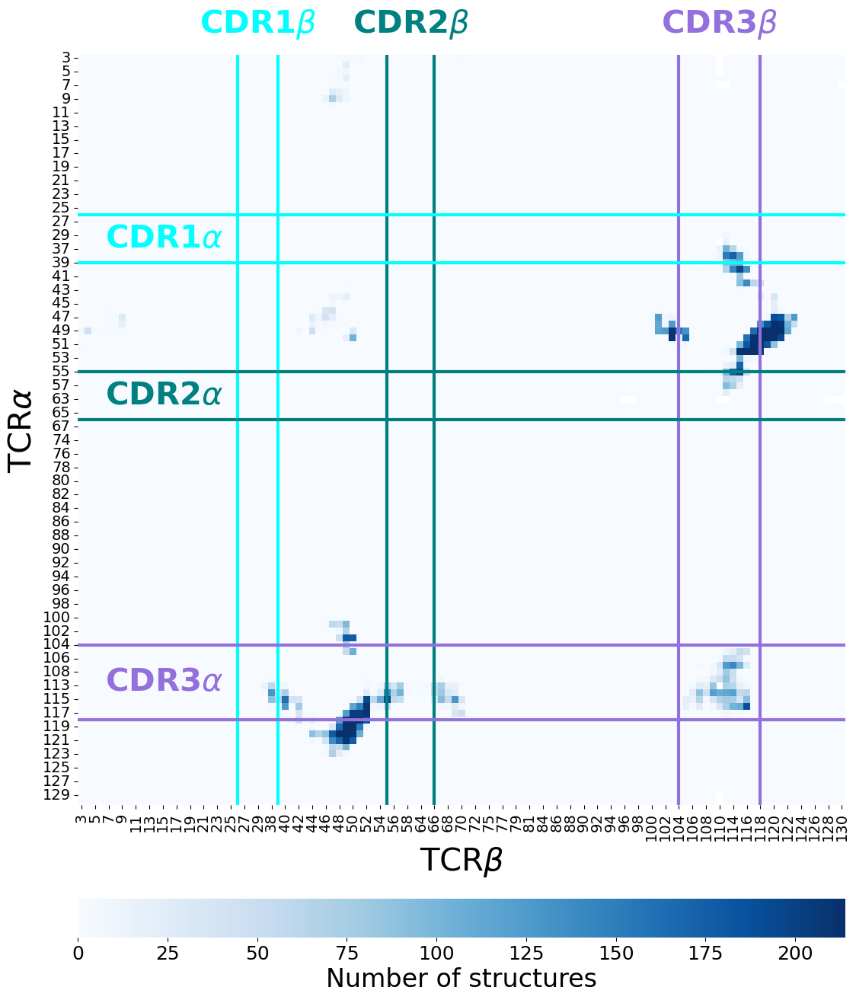

110


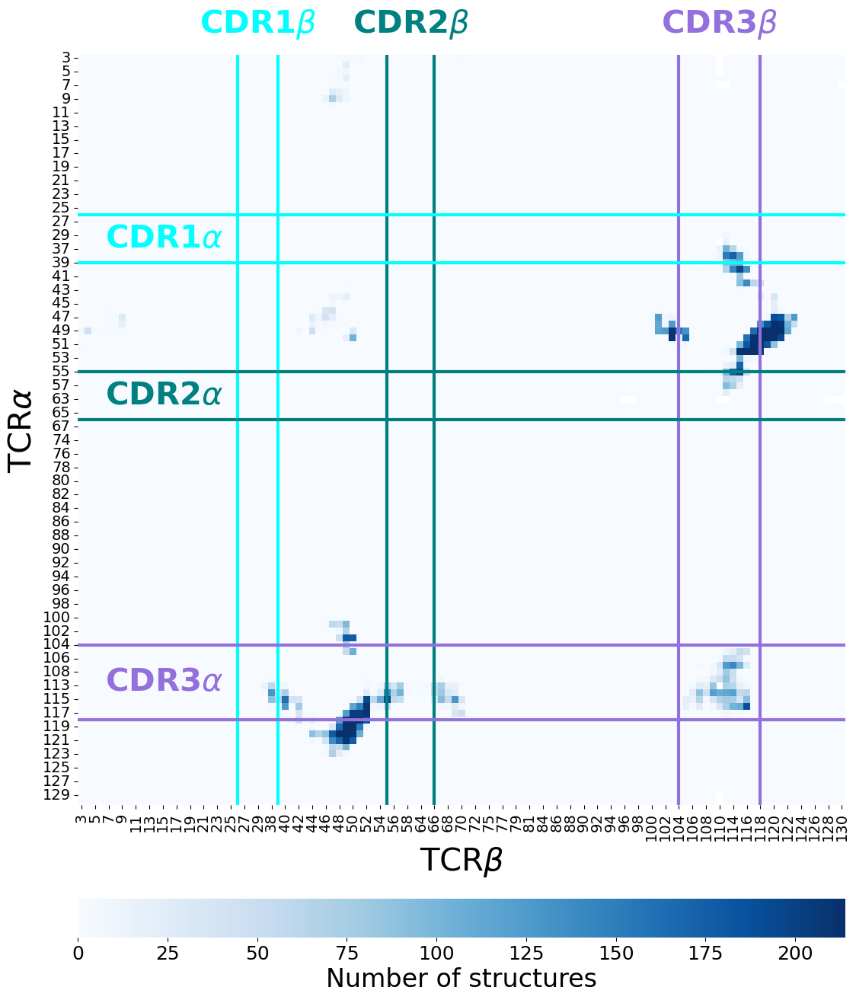

In [21]:
plot_heatmap(sort_distance_df(count), vmin=0, vmax=len(non_redudant_pdbs),cmap='Blues',
             clabel = 'Number of structures',
             save='yes', myoutput= f1 + 'count_interchain.png')

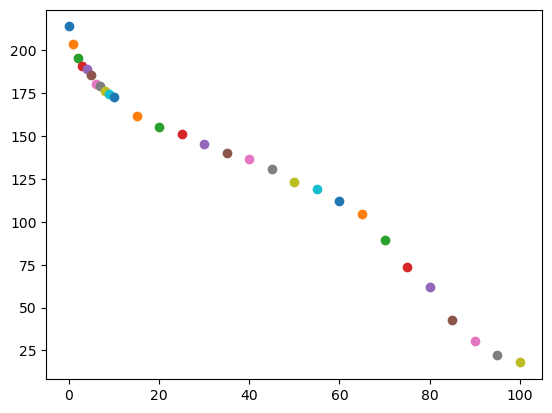

3        6.000000
4       39.833333
5        3.000000
6        2.500000
7        1.000000
          ...    
253    103.833333
254      1.000000
255      1.500000
256      0.000000
110     97.000000
Length: 239, dtype: float64
3        7.0
4       43.0
5        4.0
6        3.0
7        1.0
       ...  
254      1.0
255      2.0
256      0.0
110    107.0
C      219.0
Length: 240, dtype: float64
110


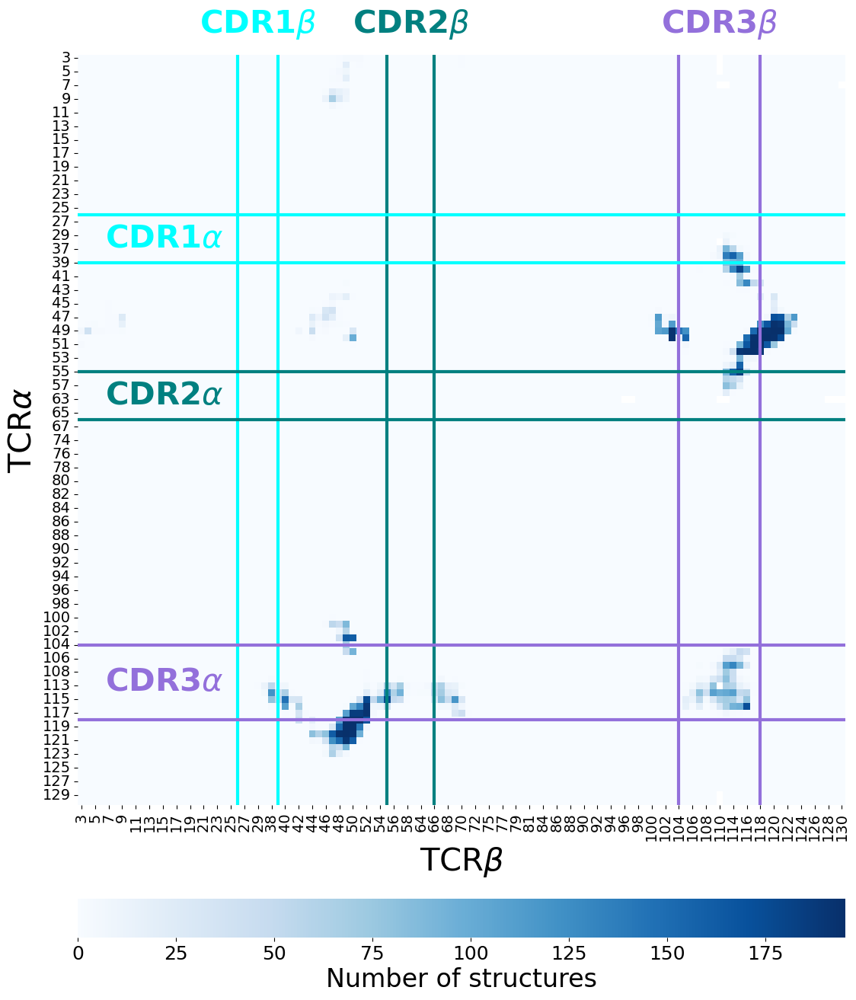

110


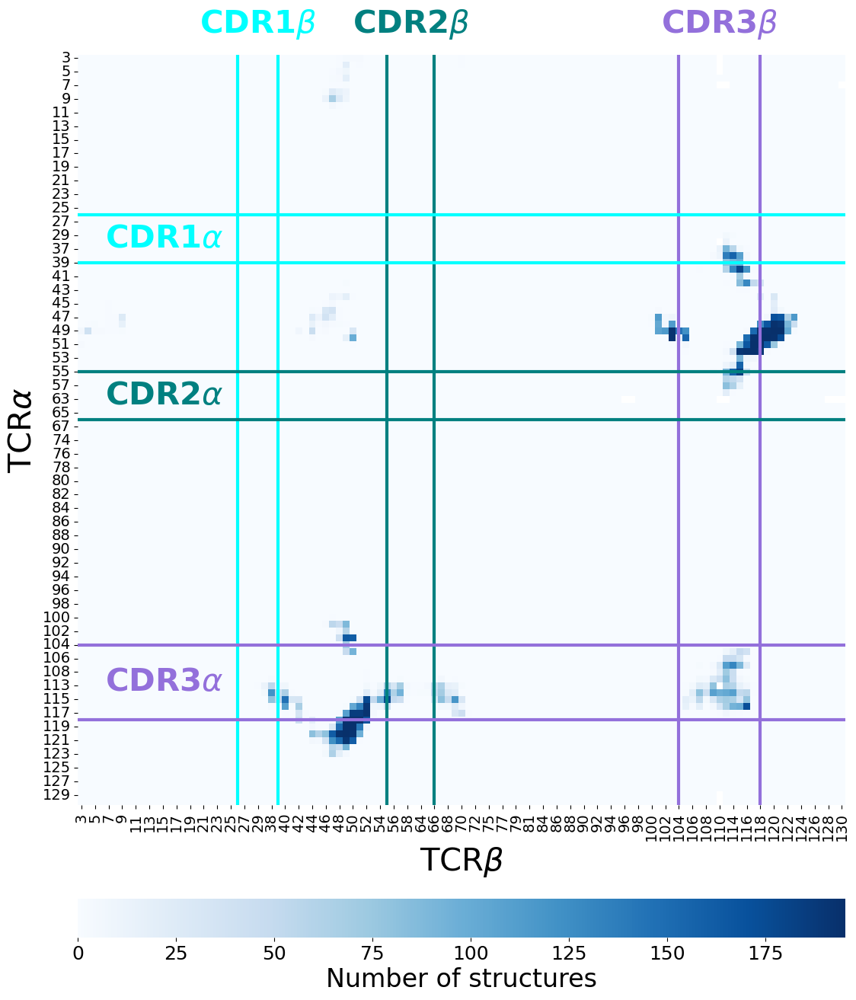

3       6.000000
4      37.166667
5       3.000000
6       2.500000
7       1.000000
         ...    
253    93.666667
254     1.000000
255     1.500000
256     0.000000
110    89.916667
Length: 239, dtype: float64
3        7.0
4       43.0
5        4.0
6        3.0
7        1.0
       ...  
254      1.0
255      2.0
256      0.0
110    107.0
C      219.0
Length: 240, dtype: float64
110


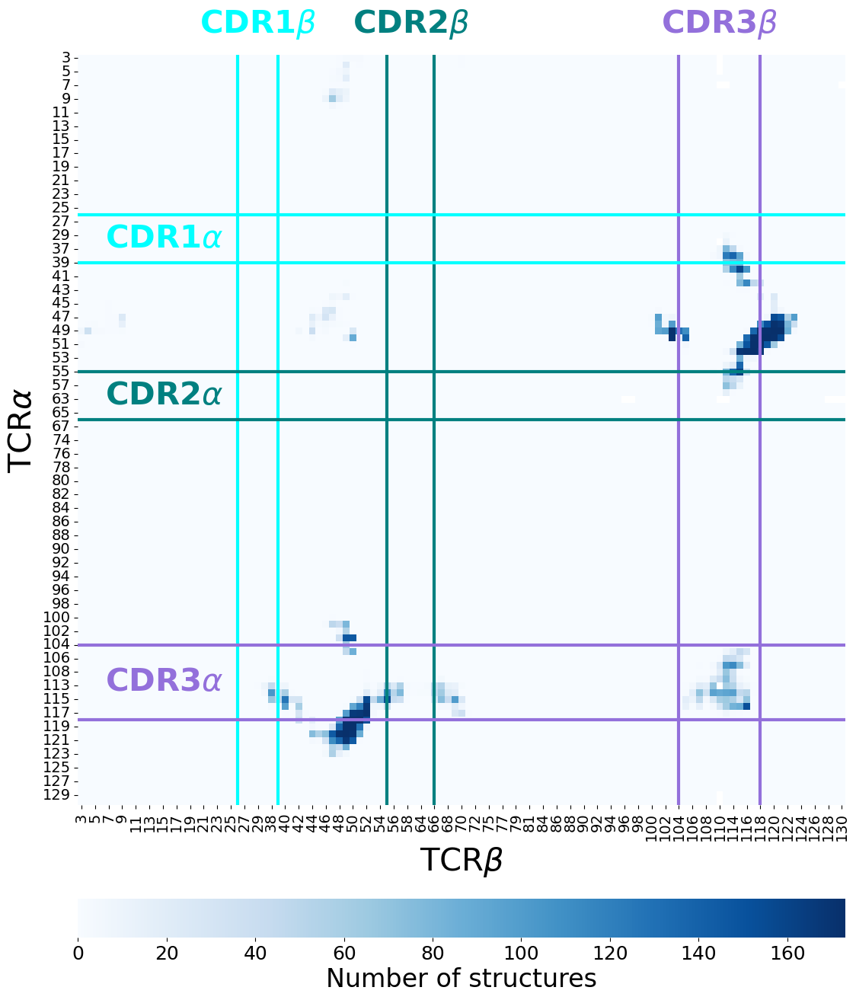

110


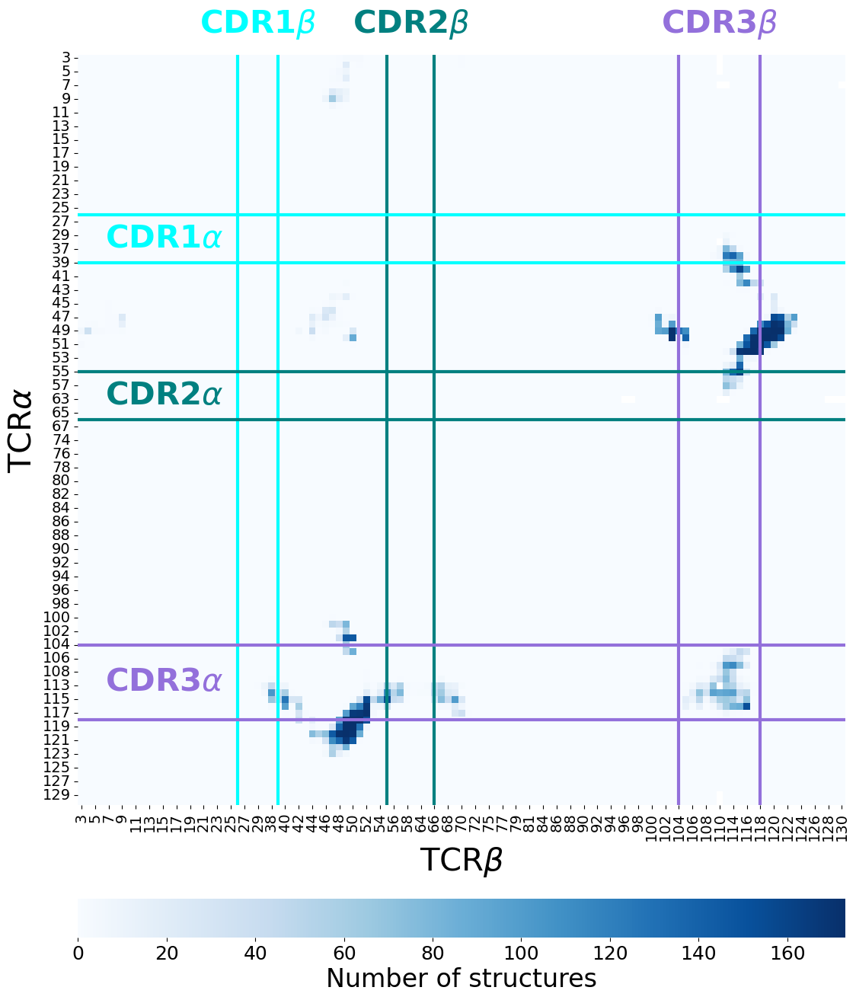

3       6.00
4      35.25
5       3.00
6       2.00
7       1.00
       ...  
253    86.65
254     1.00
255     1.50
256     0.00
110    81.45
Length: 239, dtype: float64
3        7.0
4       43.0
5        4.0
6        3.0
7        1.0
       ...  
254      1.0
255      2.0
256      0.0
110    107.0
C      219.0
Length: 240, dtype: float64
110


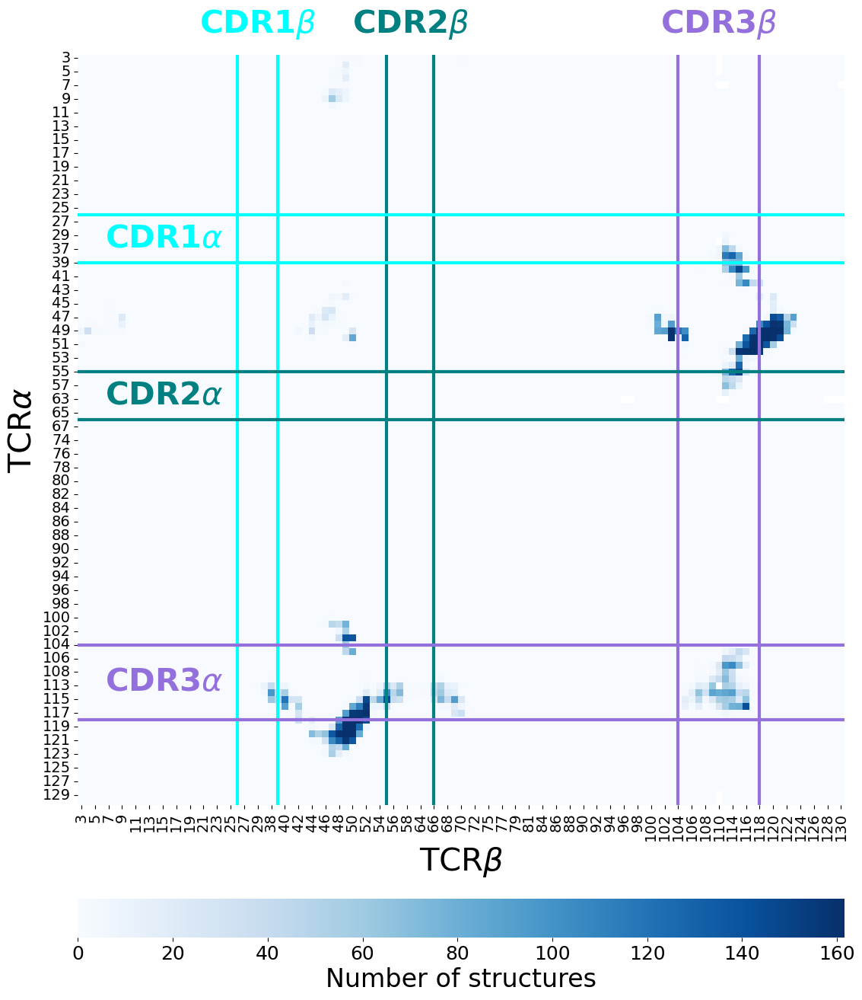

110


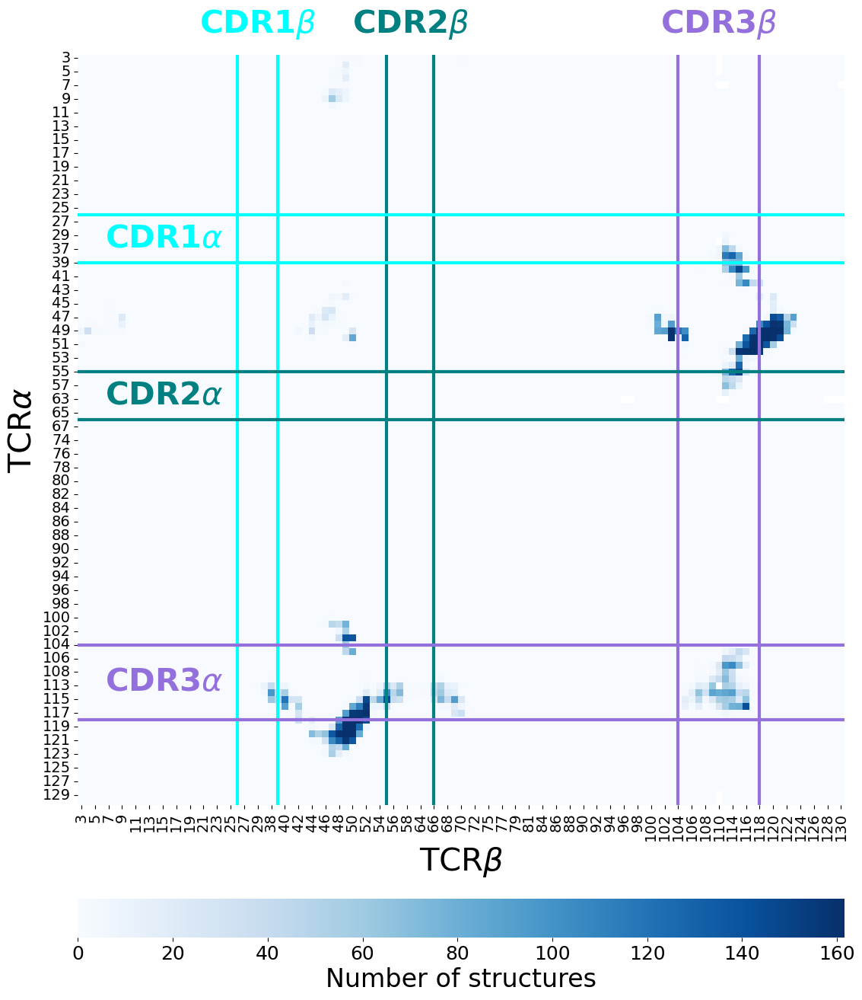

3       5.333333
4      26.023810
5       2.333333
6       2.000000
7       1.000000
         ...    
253    66.429762
254     1.000000
255     0.833333
256     0.000000
110    61.013095
Length: 239, dtype: float64
3        7.0
4       43.0
5        4.0
6        3.0
7        1.0
       ...  
254      1.0
255      2.0
256      0.0
110    107.0
C      219.0
Length: 240, dtype: float64
110


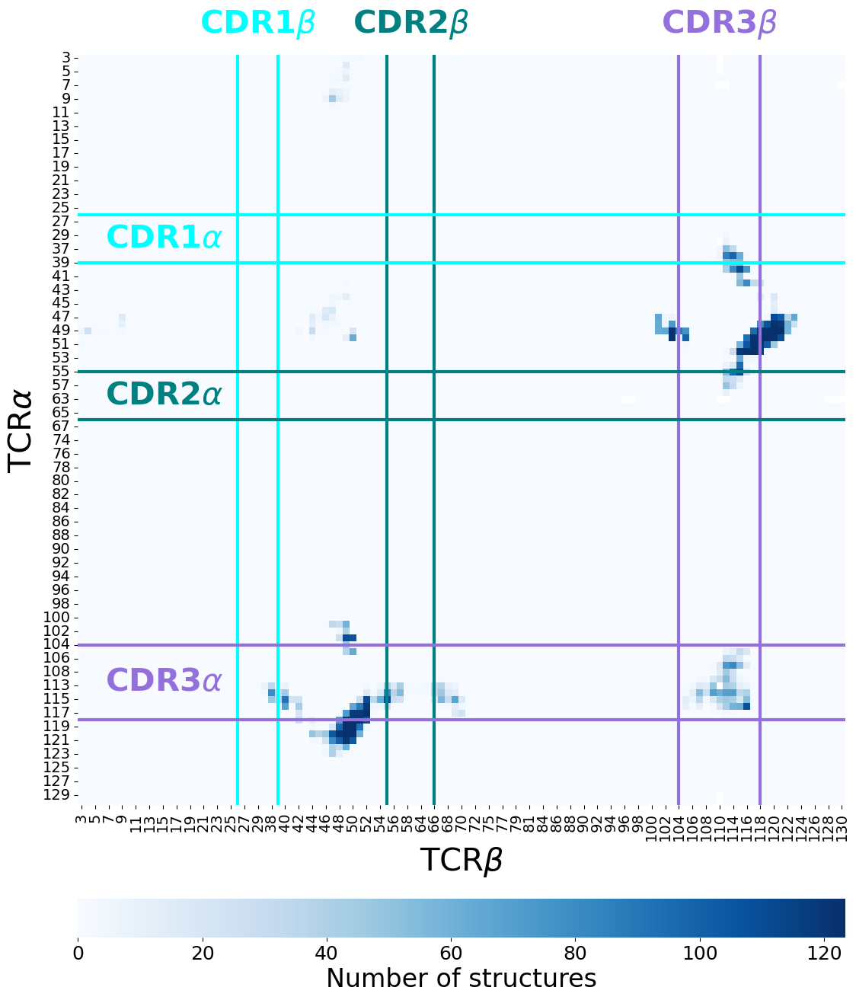

110


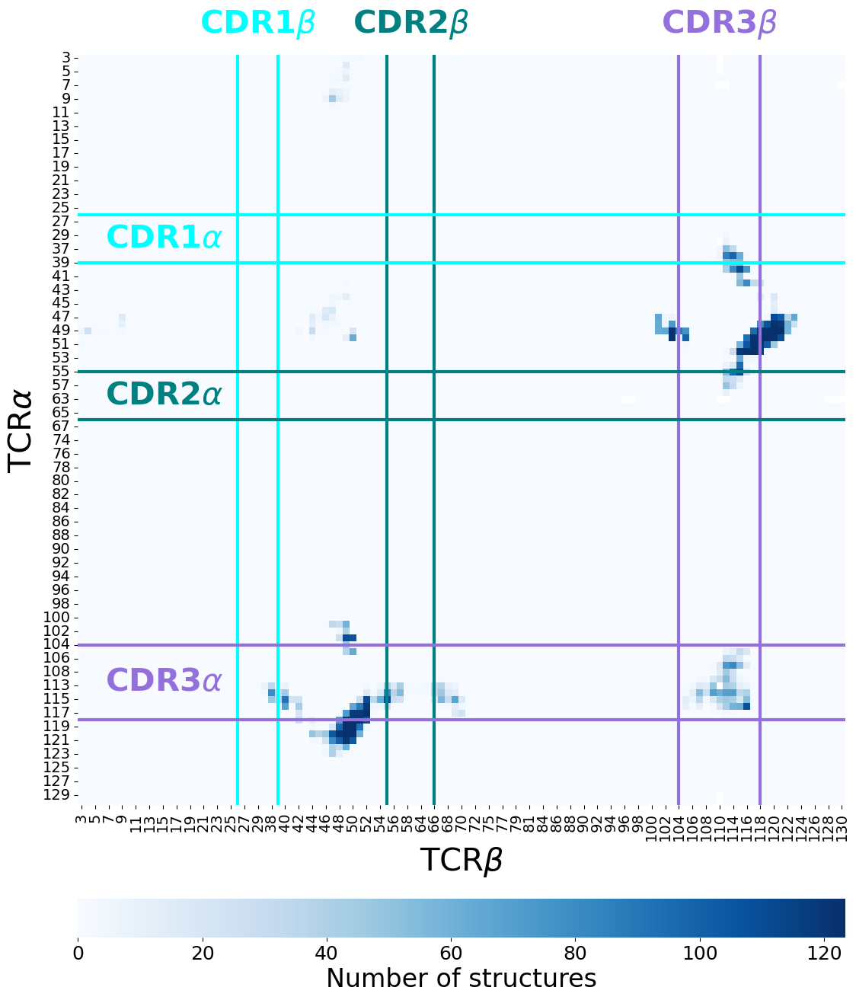

3       3.777778
4      15.039385
5       1.277778
6       1.333333
7       0.500000
         ...    
253    37.161843
254     0.500000
255     0.833333
256     0.000000
110    37.852604
Length: 239, dtype: float64
3        7.0
4       43.0
5        4.0
6        3.0
7        1.0
       ...  
254      1.0
255      2.0
256      0.0
110    107.0
C      219.0
Length: 240, dtype: float64
110


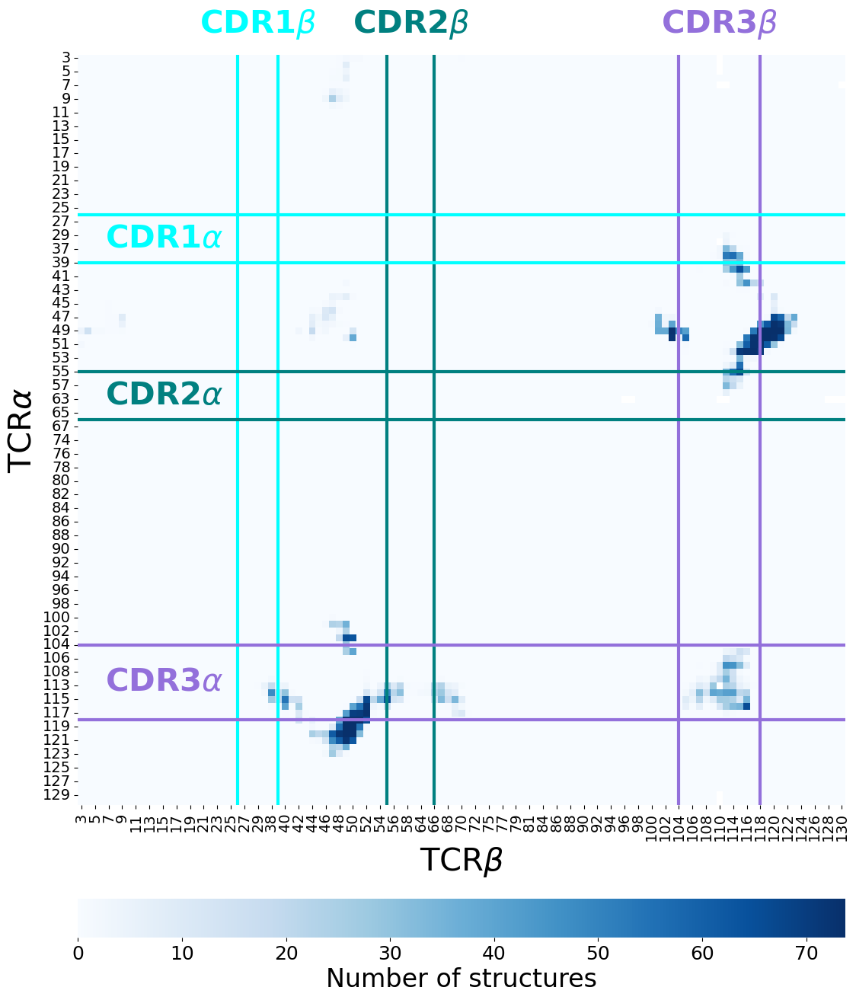

110


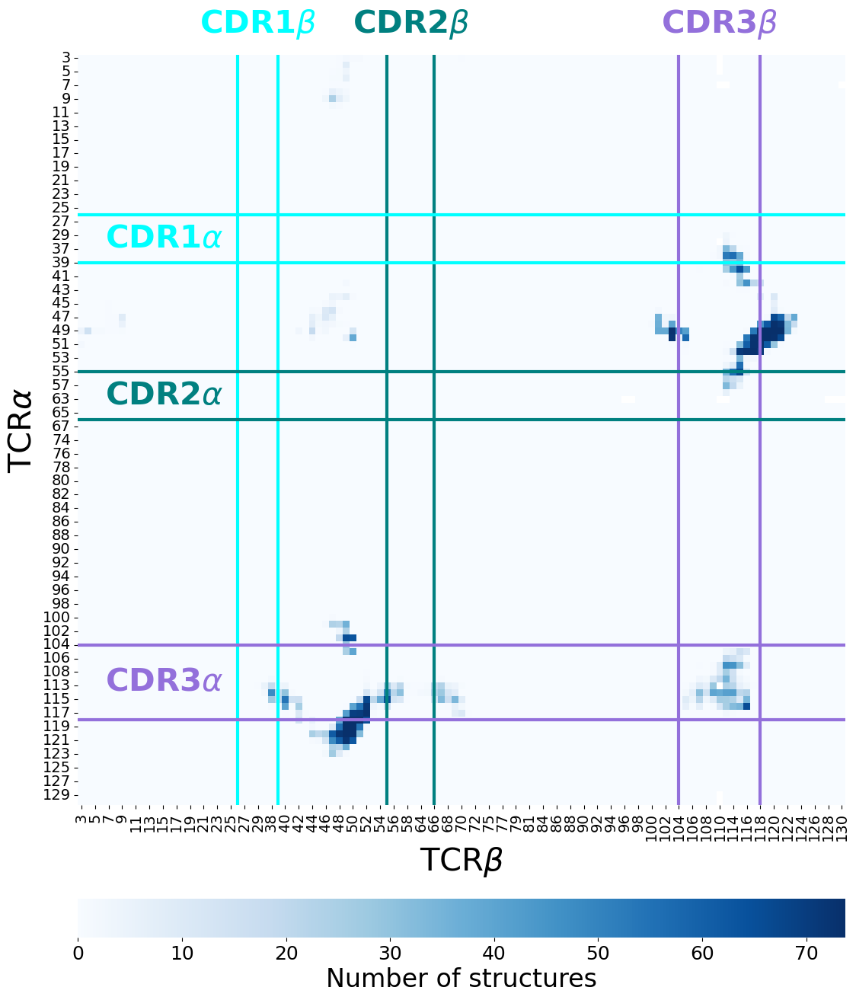

3       1.230780
4       4.204773
5       0.487923
6       0.388889
7       0.100000
         ...    
253     8.908318
254     0.083333
255     0.132576
256     0.000000
110    10.295000
Length: 239, dtype: float64
3        7.0
4       43.0
5        4.0
6        3.0
7        1.0
       ...  
254      1.0
255      2.0
256      0.0
110    107.0
C      219.0
Length: 240, dtype: float64
110


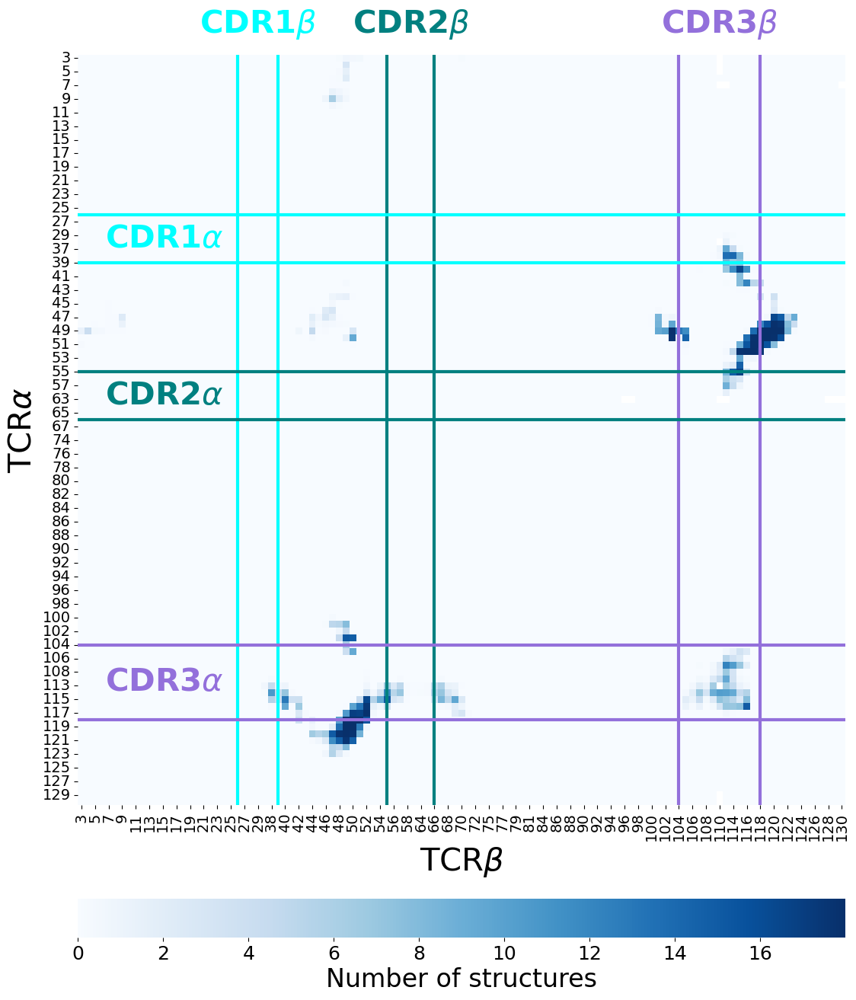

110


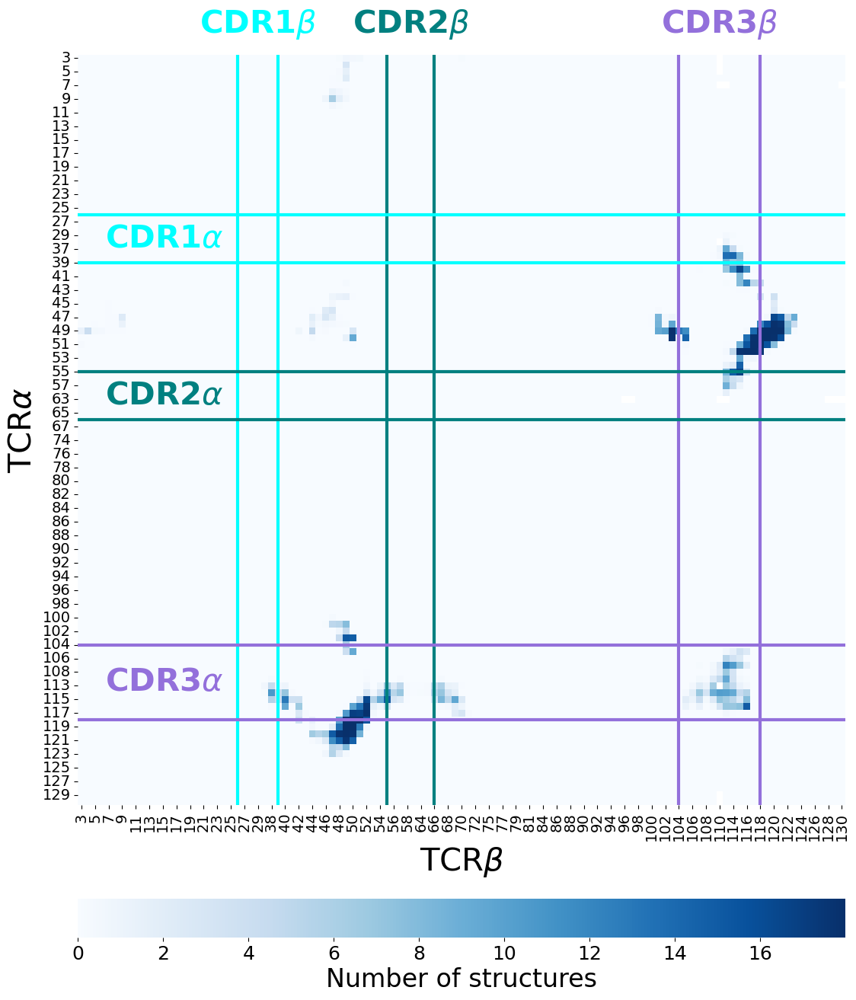

In [22]:
#Now add a heatmap where I look using the structure weights

ax = plt.subplot()
for d in [0,1,2,3,4,5,6,7,8,9,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]:
    weigth_vector = [1/np.sum(ab_dists[i] <= d) for i in range(ab_dists.shape[0])]
    ax.scatter(d, sum(weigth_vector))
plt.show()

x = count

for d in [2,10,15,50,75,100]:
    contacts = (d0 <= 10).astype(int).T
    weigth_vector = [1/np.sum(ab_dists[i] <= d) for i in range(ab_dists.shape[0])]
    contacts_weighted = contacts.mul(weigth_vector, axis=0).sum().unstack()
    if d == 100:
        y = contacts_weighted
    print(contacts_weighted.max())
    print(count.max())

    plot_heatmap(sort_distance_df(contacts_weighted), vmin=0, vmax=sum(weigth_vector),cmap='Blues',
                clabel = 'Number of structures',
                save='yes', myoutput= f1 + 'effective_count_interchain_'+str(d)+'.png')

[ 0.  0.  0. ... nan nan 62.]
[ 0.  0.  0. ... nan nan 62.]


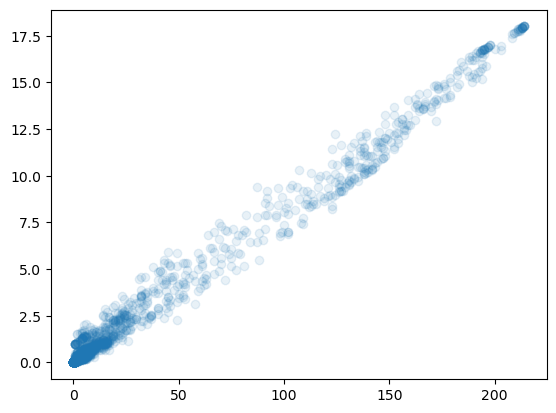

In [23]:
print(np.array(x).ravel())
print(np.array(y).ravel())

plt.scatter(x.drop('C', axis=1), y.drop('C', axis=1), alpha=0.1)